<div class="usecase-title">UC00178_Urban_Forest_Analysis</div>

<div class="usecase-authors"><b>Authored by: </b> Peregrin J Ryan</div>

<div class="usecase-duration"><b>Duration:</b> 30 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>Beginner</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>{Python, and add any more skills needed}</div>
</div>

<div class="usecase-section-header">Scenario</div>

The city of Melbourne is ever changing, it has a need to adapt to its ever growing population. As a part of that change the city of Melbourne should look at how that change has occurred. What needs have to be met, what changes have we made before that had positive impacts and how does changing one aspect of the city's infrastructure affect others? In that same vein, we now better understand the positive impacts of green spaces within our lived environment. As a part of that the cities we live in need to accommodate trees for cooling, clean air and have positive impacts on our mental health. The Urban Forest project was created as a way to look at current tree locations in Melbourne using satellite photos and over the years has collected data on how the tree coverage in Melbourne has changed. In this use case we will investigate the data from the urban forest project. Ensuring that it paints a reliable and accurate picture of the growth and development of Melboourne's urban forest. From that we will try to then draw conclusions from the data and assess whether or not the project has been a success.


<div class="usecase-section-header">What this use case will teach you</div>

At the end of this use case you will:
- Load in the correct packages using Python
- Collect data from the Melbourne open data (MOP) using API v2.1 GET request.
- Know how to take our data and prepare it for analysis.
- Use geographic mapping data in Python.
- Learn about how to join data and when it is and isn't possible
- evaluate the consistency of the data collected and see if reliable conclusions can be drawn from it
- Compare and contrast how Melbourne's urban forest has evolved, as both a project and within the city itself


<div class="usecase-section-header">Introduction and background relating to problem:</div>

This use case uses the Melbourne Urban Forest data set from the MOP. Which is data made up of detected trees using satellite photos. This had begun in 2008 with just the locations of the trees. However, later in 2011 new information about the trees was added. Their dates of then were planted and IDs for each tree. Although the tree origin dates were not always known and this feature was not supported in the following years. Also in 2021 they had redone the geographic locations and removed the ids. Meaning there is no data linking them back up to the previous 11 years worth of data (2008 - 2019).


So our goal here is to try to find out the story of not only the urban forest of Melbourne. But also work out how to make the data workable. And if possible combine some of the data so it isn't spread out through multiple different datasets and provide the user with a concise melbourne forest dataset. We will look at mapping the data over Melbourne, combining the data. Checking for the oldest trees and seeing the difference of trees in each year's findings.

## Datasets used:
Dataset 1: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2008-urban-forest/information/

Dataset 2: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2011-urban-forest/information/

Dataset 3: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2013/information/

Dataset 4: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2014/information/

Dataset 5: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2015-urban-forest/information/

Dataset 6: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-public-realm-2018-urban-forest/information/

Dataset 7: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2018-entire-municipal-area-urban-forest/information/

Dataset 8: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2019/information/

Dataset 9: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2021-urban-forest/information/


## Step 1: Import packages
This use case will require a number of packages to work. These are simple to include and import. However, if they are not installed using the command `! pip install`, which will ensure the packages are installed on your instance of Python.

One package cannot be imported however, `API_store` is a file you will need to create locally in the same folder as this use case. It will contain your MOP API key (stored as `API = <Insert your key here>`). Simply create the file in the same folder as this one and it should be imported without any issues.

In [1]:
# Uncomment these to install the packages needed:
# ! pip install requests
# ! pip install pandas
# ! pip install geopandas
# ! pip install contextily
# ! pip install matplotlib.pyplot

In [2]:
# Imports needed to request and collect data from API
import requests
# Used to work with our data
import pandas as pd
# Used in our API call
from io import StringIO
# Create this as a local file to store your API key
import API_store
# This helps us just avoid pop ups that we don't need
import warnings
warnings.filterwarnings('ignore')
# Used to put the geogpraphic data on the map
import geopandas as gpd
# Get geotiles to show Melbourne city
import contextily as ctx
# Used to plot visualisations
import matplotlib.pyplot as plt


## Step 2: Import Data

This is where we call a function called collect data and we then use our API key to get all of the .csv files we need. But when we read in those .csv files we convert them into Pandas data frames. This allows us a way to work with that data to visualise it and take what we need. This pulls from MOP's v2.1 API.

In [3]:
# This is the function to collect the data from the API
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    apikey = API_store.API
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC',
        'api_key': apikey
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')

Here is where we use the function we just called to collect the data we need. We will go through each of our datasets and make a dataframe for each of them.

In [4]:
dataset_ids = ['tree-canopies-2008-urban-forest','tree-canopies-2011-urban-forest','tree-canopies-2013',
               'tree-canopies-2014', 'tree-canopies-2015-urban-forest', 'tree-canopies-public-realm-2018-urban-forest',
               'tree-canopies-2018-entire-municipal-area-urban-forest', 'tree-canopies-2019', 'tree-canopies-2021-urban-forest']

tree_canopy_2008 = collect_data(dataset_ids[0]) 
tree_canopy_2011 = collect_data(dataset_ids[1])
tree_canopy_2013 = collect_data(dataset_ids[2])
tree_canopy_2014 = collect_data(dataset_ids[3])
tree_canopy_2015 = collect_data(dataset_ids[4])
tree_canopy_2018_pr = collect_data(dataset_ids[5])
tree_canopy_2018_ma = collect_data(dataset_ids[6])
tree_canopy_2019 = collect_data(dataset_ids[7])
tree_canopy_2021 = collect_data(dataset_ids[8])

Now that we have waited a good while and have our datasets, we need to verify that they are actually loaded in. As well as get an understanding of what is included in each dataset. We can do that by calling the dataset and using the command `.head(3)`. This will print out the first three rows of each dataset. That way we can know they were loaded in, since they aren't empty. We can also see the shape of each of our datasets, which will be helpful in our analysis.

In [5]:
tree_canopy_2008.head(3)

,geo_point_2d,geo_shape,updated_by,shape_area,data_linea,shape_leng,updated_da
0,"-37.81976781729536, 144.94441801188927","{""coordinates"": [[[[144.94441865724306, -37.81...",Grace Detailed-GIS Services,2.735103,Tree canopy mapped using 2008 aerial photos an...,6.111304,3 Dec 2011
1,"-37.806110716056814, 144.9503206954275","{""coordinates"": [[[[144.95033282662382, -37.80...",Grace Detailed-GIS Services,21.070870,Tree canopy mapped using 2008 aerial photos an...,16.794555,3 Dec 2011
2,"-37.8203253438025, 144.97620406411045","{""coordinates"": [[[[144.97619825473942, -37.82...",Grace Detailed-GIS Services,21.010537,Tree canopy mapped using 2008 aerial photos an...,17.263569,3 Dec 2011


In [6]:
tree_canopy_2008.shape

(58790, 7)

In [7]:
tree_canopy_2011.head(3)

,geo_point_2d,geo_shape,tree_area,street_fro,data_lin_1,yearplant,street_nam,updated_by,shape_area,park_stree,...,street_to,family,ggis_id,overhead_c,date_plant,t11,canopy_dia,height_11,descriptio,roadseg_de
0,"-37.7971025448064, 144.92805294520574","{""coordinates"": [[[[144.92808097355524, -37.79...",85.552695,NaN,Tree Inventory: Existing data (fields from GIS...,0,NaN,Grace Detailed-GIS Services. info@gracegis.com.au,85.552695,NaN,...,NaN,NaN,91186,NaN,NaN,11,0.0,9.0,NaN,NaN
1,"-37.79677607198214, 144.92647587608803","{""coordinates"": [[[[144.92650356294064, -37.79...",30.053766,NaN,Tree Inventory: Existing data (fields from GIS...,0,NaN,Grace Detailed-GIS Services. info@gracegis.com.au,30.053766,NaN,...,NaN,NaN,91190,NaN,NaN,11,0.0,7.0,NaN,NaN
2,"-37.79615547394656, 144.93082811899046","{""coordinates"": [[[[144.93088560280367, -37.79...",63.268135,Wolseley Parade,Tree Inventory: Existing data (fields from GIS...,1997,Bellair Street,Grace Detailed-GIS Services. info@gracegis.com.au,63.268135,Street,...,Ormond Street,Platanaceae,91192,Powerlines - High Voltage,1997-07-10T07:00:00.000Z,11,18.0,11.0,Tree - Platanus x acerifolia,Bellair Street between Wolseley Parade and Orm...


In [8]:
tree_canopy_2011.shape

(94699, 51)

In [9]:
tree_canopy_2013.head(3)

,geo_point_2d,geo_shape,height_yes,shape_area,objectid,shape_leng,updated_da,z_mean,tree_area,ggis_id
0,"-37.806246879737216, 144.96970978306726","{""coordinates"": [[[[144.96970594591048, -37.80...",1,151.827026,40237,0,NaN,12.397475,0,40237
1,"-37.807593655723785, 144.9689869340393","{""coordinates"": [[[[144.9690219077581, -37.807...",1,96.403141,40240,0,NaN,10.970085,0,40240
2,"-37.80816803252643, 144.96909090925465","{""coordinates"": [[[[144.96914581221284, -37.80...",1,74.907543,40244,0,NaN,8.217809,0,40244


In [10]:
tree_canopy_2013.shape

(99194, 10)

In [11]:
tree_canopy_2014.head(3)

,geo_point_2d,geo_shape,shape_area,t,objectid,shape_leng,ggis_id,height_min
0,"-37.80701864340057, 144.97261514642457","{""coordinates"": [[[[144.97262202661392, -37.80...",2.417016,2014,29804,0,2173,1.782669
1,"-37.806174766348335, 144.96921747656356","{""coordinates"": [[[[144.9692316752021, -37.806...",6.281363,2014,29845,0,2310,3.082909
2,"-37.77611151375127, 144.9413844567119","{""coordinates"": [[[[144.94141107471987, -37.77...",23.420418,2014,18,0,83,3.018570


In [12]:
tree_canopy_2014.shape

(64877, 8)

In [13]:
tree_canopy_2015.head(3)

,geo_point_2d,geo_shape,qa_id_1,shape_area,area_2015,change_cod,objectid,shape_leng
0,"-37.8132856902069, 144.9376259709783","{""coordinates"": [[[[144.9376490219097, -37.813...",0,16.149718,16.149718,0,13997,0
1,"-37.81417888455938, 144.98595565504826","{""coordinates"": [[[[144.98600146936536, -37.81...",0,43.249905,43.249905,0,13973,0
2,"-37.81403106747944, 144.9717996210107","{""coordinates"": [[[[144.9718760555555, -37.813...",0,232.403334,232.403334,0,13999,0


In [14]:
tree_canopy_2015.shape

(60712, 8)

In [15]:
tree_canopy_2018_pr.head(3)

,geo_point_2d,geo_shape,objectid,shape_leng,shape_area
0,"-37.787924849178765, 144.95013560084595","{""coordinates"": [[[[144.95014678527318, -37.78...",27905,22.910803,35.618151
1,"-37.78758587991684, 144.94758519515517","{""coordinates"": [[[[144.94759778226256, -37.78...",28004,11.677391,9.861962
2,"-37.78766984132651, 144.950294465972","{""coordinates"": [[[[144.9503028706184, -37.787...",27988,4.824124,1.363877


In [16]:
tree_canopy_2018_pr.shape

(32787, 5)

In [17]:
tree_canopy_2018_ma.head(3)

,geo_point_2d,geo_shape,objectid,shape_leng,shape_area
0,"-37.79985604102316, 144.94863020815643","{""coordinates"": [[[[144.94869965802565, -37.79...",29435,114.357712,248.017254
1,"-37.80012294659624, 144.96904230676208","{""coordinates"": [[[[144.9690200627957, -37.800...",29440,22.209443,30.098817
2,"-37.80011811346107, 144.97185932314238","{""coordinates"": [[[[144.9718664539436, -37.800...",29471,4.979338,1.658130


In [18]:
tree_canopy_2018_ma.shape

(54680, 5)

In [19]:
tree_canopy_2019.head(3)

,geo_point_2d,geo_shape,id
0,"-37.784962927741944, 144.95519313686472","{""coordinates"": [[[144.9551970314, -37.7849672...",10353
1,"-37.78488111587239, 144.95339190805294","{""coordinates"": [[[144.9534233774, -37.7848441...",10323
2,"-37.78426793334865, 144.91692051327425","{""coordinates"": [[[144.9168734348, -37.7842844...",10342


In [20]:
tree_canopy_2019.shape

(114784, 3)

In [21]:
tree_canopy_2021.head(3)

,geo_point_2d,geo_shape
0,"-37.77506304683423, 144.93898465421296","{""coordinates"": [[[[144.9389624164712, -37.775..."
1,"-37.775132956993566, 144.93979253397976","{""coordinates"": [[[[144.93978541786475, -37.77..."
2,"-37.775360479960504, 144.94145114868167","{""coordinates"": [[[[144.941452857118, -37.7753..."


In [22]:
tree_canopy_2021.shape

(57980, 2)

From this we have confirmed a few important things that will affect how we go forward when working with this data. First, we have a few datasets and each seems to be different from one another. First, some of the datasets are much larger than others for example the 2019 dataset has roughly 114,000 entries. Whereas the initial 2008 dataset has only 58,000 entries. So we will need to figure out what they cover and to what extent all of the different datasets are compatible with one another.


The other thing is that some of the earlier dataset have more information than the later ones. Since we are comparing all datasets and their progression we will need to make the data more compatible. So we will only look at a few columns. We will keep the `geo_point_2d`, `geo_shape` and the `id`. Keeping in mind that the 2021 has no `id` so we will see if it can be backfilled based on the `geo_point_2d` data we have. We will also use the 2011 `yearplant` data for some trees with an ID. That way we can see how old some of the trees are and if they are still around in later datasets. This will require a few assumptions about the data. First the `id` is consistent through the whole dataset and doesn't change each year or over the years. For measuring consistency and how long a tree has been in a location we will need to rely on the `geo_point_2d`s to be the same and if not very consistent with one another.


With these challenges established lets begin cleaning our datasets to just the columns we want to work with. As well as look for any missing data within our data.

## Step 3: Data Wrangling
In data analysis this is one of the most important steps. We will be cleaning up our data since it was sourced over a long time and each survey might have changed. For our analysis we need to standardise it so we can get a clear picture when we analyse the data later on.

### 3.1 Organise Columns
The first step as discussed is to standardise the columns. So we will get each data set year and get the `geo_points_2d` and `geo_shape` columns and where applicable the `id` (or equivalent). Lets also use the `yearplant` from 2011's data and make a new dataframe to store the year the trees were planted, the `id` and the `geo_points_2d`.

In [23]:
# Replace original data frames with new ones that just have what we need.
tree_canopy_2008 = tree_canopy_2008[['geo_point_2d', 'geo_shape']]
tree_canopy_2011 = tree_canopy_2011[['geo_point_2d', 'geo_shape','objectid', 'yearplant']]
tree_canopy_2013 = tree_canopy_2011[['geo_point_2d', 'geo_shape','objectid']]
tree_canopy_2014 = tree_canopy_2011[['geo_point_2d', 'geo_shape','objectid']]
tree_canopy_2015 = tree_canopy_2011[['geo_point_2d', 'geo_shape','objectid']]
tree_canopy_2018_pr = tree_canopy_2018_pr[['geo_point_2d', 'geo_shape','objectid']]
tree_canopy_2018_ma = tree_canopy_2018_ma[['geo_point_2d', 'geo_shape','objectid']]
tree_canopy_2019 = tree_canopy_2019[['geo_point_2d', 'geo_shape','id']]
tree_canopy_2021 = tree_canopy_2021[['geo_point_2d', 'geo_shape']]

# Rename 2019's `id` to `objectid` to match the other data:
tree_canopy_2019 = tree_canopy_2019.rename(columns={'id': 'objectid'})

In [24]:
# Combine the 2018 data

tree_canopy_2018 = pd.concat([tree_canopy_2018_pr, tree_canopy_2018_ma], ignore_index=True).drop_duplicates(subset=["geo_point_2d"])


### 3.2 Check for missing data
Now that our data has what we are looking for we need to see if there is any data that is missing from our dataframes. We can do this using the `isnull()` pandas function. It tells us if there are any missing values by giving us a `boolean` response. if there is, it will return `True`. We can then investigate further if it does return as `True`.

In [25]:
print("2008 any null values:    ",tree_canopy_2008.isnull().values.any())
print("2011 any null values:    ",tree_canopy_2011.isnull().values.any())
print("2013 any null values:    ",tree_canopy_2013.isnull().values.any())
print("2014 any null values:    ",tree_canopy_2014.isnull().values.any())
print("2015 any null values:    ",tree_canopy_2015.isnull().values.any())
print("2018 any null values:    ",tree_canopy_2018.isnull().values.any())
print("2019 any null values:    ",tree_canopy_2019.isnull().values.any())
print("2021 any null values:    ",tree_canopy_2021.isnull().values.any())

2008 any null values:     False
2011 any null values:     False
2013 any null values:     False
2014 any null values:     False
2015 any null values:     False
2018 any null values:     True
2019 any null values:     False
2021 any null values:     False


From this we can know that for most of our datasets we have no null values in the data. This is great, however the 2018 public realm data had shown that it was missing some values so we can investigate further.

In [26]:
# Print a formatted readout to see what values are missing from each column, then give a percentage of missing data
print(f"Missing data:\n{tree_canopy_2018_pr.isnull().sum()}\n------",
      f"\nTotal missing values: {len(tree_canopy_2018_pr[tree_canopy_2018_pr.isnull().any(axis=1)])}\nTotal values: {len(tree_canopy_2018_pr)}",
      f"\nPercent of missing values: {round((len(tree_canopy_2018_pr[tree_canopy_2018_pr.isnull().any(axis=1)])/len(tree_canopy_2018_pr))*100,2)}%")

Missing data:
geo_point_2d    0
geo_shape       2
objectid        0
dtype: int64
------ 
Total missing values: 2
Total values: 32787 
Percent of missing values: 0.01%


So we can see that we are missing only two `geo_shape` data. However, that doesn't cause any issues for us since we would only use that for drawing our trees on the map. And aren't needed for our analysis. So we don't have to remove them.

### 3.3 Look for duplicate data
Now we want to quickly check to see if there are any duplicate values in our dataset. Since we don't want to have potential double ups in our data, which can cause issues when visualising. We can use the `duplicated()` command built into pandas to check this. It will return a `bool` value telling us if there are any duplicates with `True` just like before.

In [27]:
# We simply print the returned boolean values so we can print them in a human readable way
print("2008 any null values:    ",tree_canopy_2008.duplicated().any())
print("2011 any null values:    ",tree_canopy_2011.duplicated().any())
print("2013 any null values:    ",tree_canopy_2013.duplicated().any())
print("2014 any null values:    ",tree_canopy_2014.duplicated().any())
print("2015 any null values:    ",tree_canopy_2015.duplicated().any())
print("2018 any null values:    ",tree_canopy_2018.duplicated().any())
print("2019 any null values:    ",tree_canopy_2019.duplicated().any())
print("2021 any null values:    ",tree_canopy_2021.duplicated().any())

2008 any null values:     False
2011 any null values:     False
2013 any null values:     False
2014 any null values:     False
2015 any null values:     False
2018 any null values:     False
2019 any null values:     False
2021 any null values:     False


### 3.4 Make Lat and Long
Since our data cant be visualised with just the `geo_point_2d`. We will need to split it into the latitiude (`lat`) and longatude(`lon`).

In [28]:
tree_canopy_2008[['lat', 'lon']] = tree_canopy_2008['geo_point_2d'].str.split(',', expand=True).astype(float)
tree_canopy_2011[['lat', 'lon']] = tree_canopy_2011['geo_point_2d'].str.split(',', expand=True).astype(float)
tree_canopy_2013[['lat', 'lon']] = tree_canopy_2013['geo_point_2d'].str.split(',', expand=True).astype(float)
tree_canopy_2014[['lat', 'lon']] = tree_canopy_2014['geo_point_2d'].str.split(',', expand=True).astype(float)
tree_canopy_2015[['lat', 'lon']] = tree_canopy_2015['geo_point_2d'].str.split(',', expand=True).astype(float)
tree_canopy_2018[['lat', 'lon']] = tree_canopy_2018['geo_point_2d'].str.split(',', expand=True).astype(float)
tree_canopy_2019[['lat', 'lon']] = tree_canopy_2019['geo_point_2d'].str.split(',', expand=True).astype(float)
tree_canopy_2021[['lat', 'lon']] = tree_canopy_2021['geo_point_2d'].str.split(',', expand=True).astype(float)

## Step 4: Data Quality Analysis
Now that we have set up our data for the most part we need to discuss some important elements. First is looking into the data and the quality of it. Since we are working with a lot of different data from different collections. Our analysis should focus on two things. Evaluating the quality of the data and trying to understand how it can be improved. What we are doing in this section is looking into the data to then provide feedback back to the client about how to approach the continuation of the 'urban forest' project or any other continuous data taken over years.


### 4.1: Simple data visualisation to see if we are comparing data form the same area
Since we cannot quickly tell just by looking at the data we should do a quick visual comparison to see if the geo location data is all within the same area of one another. So we will print them out over a map of Melbourne using a `GeoDataFrame` and `contextily` to have a map of Melbourne.

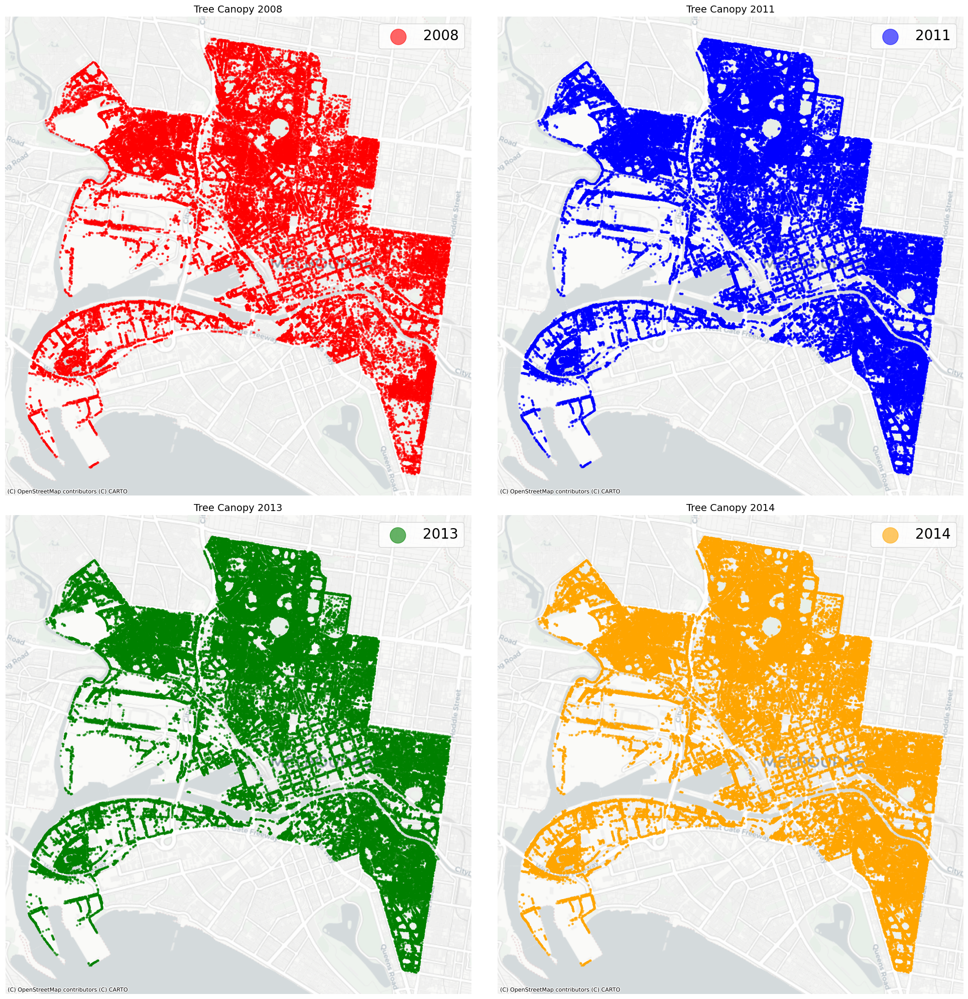

In [29]:
# Dictionary of datasets by year and their colors
datasets = {
    2008: {'df': tree_canopy_2008, 'color': 'red'},
    2011: {'df': tree_canopy_2011, 'color': 'blue'},
    2013: {'df': tree_canopy_2013, 'color': 'green'},
    2014: {'df': tree_canopy_2014, 'color': 'orange'}
}

fig, axes = plt.subplots(2, 2, figsize=(20, 20))
axes = axes.flatten()

for i, (year, info) in enumerate(datasets.items()):
    df = info['df']
    color = info['color']
    
    # Make GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df['lon'], df['lat']),
        crs="EPSG:4326"
    )
    # Reproject to Web Mercator
    gdf = gdf.to_crs(epsg=3857)
    
    # Plot with the assigned color
    ax = axes[i]
    gdf.plot(ax=ax, alpha=0.6, markersize=5, color=color, label=str(year))
    
    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    
    # Title and clean axes
    ax.set_title(f"Tree Canopy {year}", fontsize=14)
    ax.axis('off')
    ax.legend(loc="upper right",fontsize=20, markerscale=10)

plt.tight_layout()
plt.show()

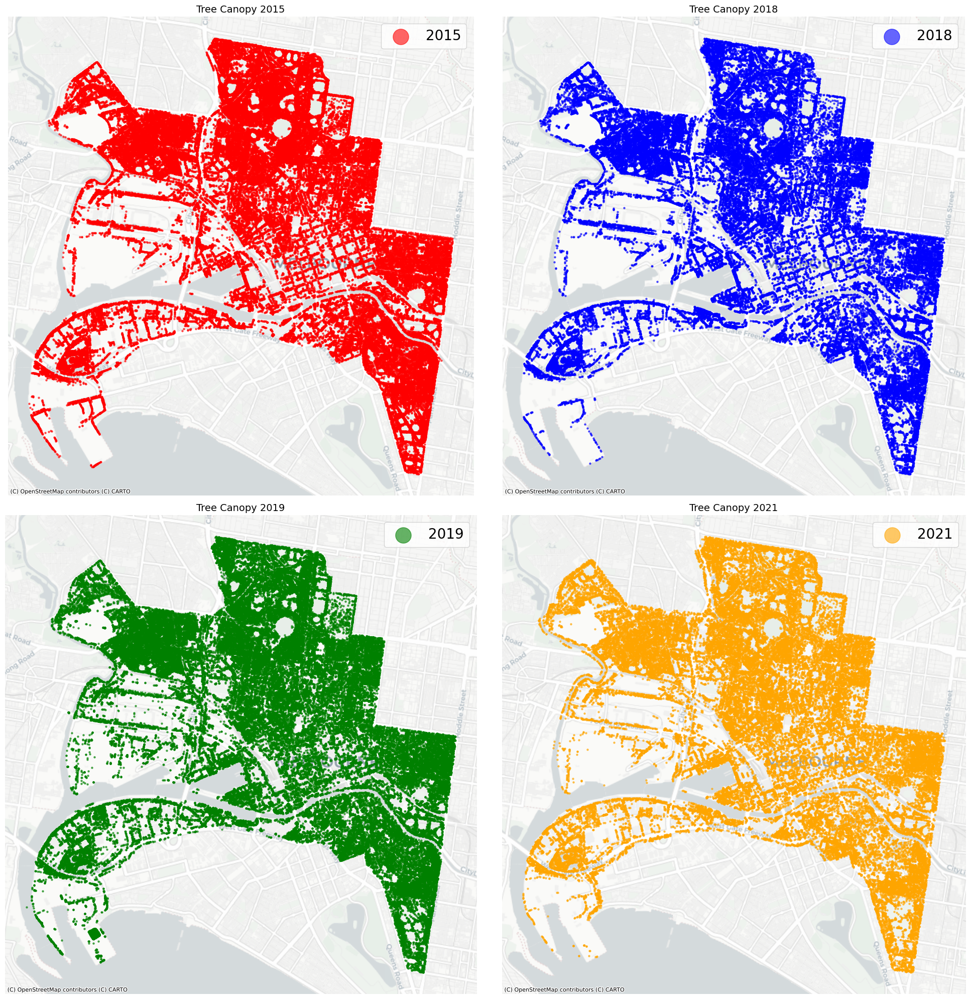

In [30]:
# Dictionary of datasets by year and their colors
datasets = {
    2015: {'df': tree_canopy_2015, 'color': 'red'},
    2018: {'df': tree_canopy_2018, 'color': 'blue'},
    2019: {'df': tree_canopy_2019, 'color': 'green'},
    2021: {'df': tree_canopy_2021, 'color': 'orange'}
}

fig, axes = plt.subplots(2, 2, figsize=(20, 20))
axes = axes.flatten()

for i, (year, info) in enumerate(datasets.items()):
    df = info['df']
    color = info['color']
    
    # Make GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df['lon'], df['lat']),
        crs="EPSG:4326"
    )
    # Reproject to Web Mercator
    gdf = gdf.to_crs(epsg=3857)
    
    # Plot with the assigned color
    ax = axes[i]
    gdf.plot(ax=ax, alpha=0.6, markersize=5, color=color, label=str(year))
    
    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    
    # Title and clean axes
    ax.set_title(f"Tree Canopy {year}", fontsize=14)
    ax.axis('off')
    ax.legend(loc="upper right",fontsize=20, markerscale=10)

plt.tight_layout()
plt.show()

This does show that at least at a large scale there are no large holes in our data, and they all are contained within the same space in the city. So for the moment we can see that any analysis we perform will be talking about similar data from a similar region. We can also see the slight differences over the years of data collection where small groupings and 'blips' of trees have appeared or disappeared.

### 4.2: Investigating `objectid` data and comparing
First thing we will do before even digging into the data is look at combining the data along the `objectid` since that is the unique identifier given for each tree. It should let us combine the data we have and also allow us to compare if other elements are similar. For example if the `geo_point_2d` had changed over the years. We will only do this for the data that contains the `objectid`'s since the 2008 and most recent 2021 data do not contain these. Making it harder for us to analyse. But if the `geo_point_2d` remains similar then we can combine the 2008 data and the 2021 data with it.

#### 4.2.1: Build a combine dataframe
Here is where we begin to build our combined dataframe where we can analyse our data further. Our approach will be to start with a copy of the 2011 data and build off of that. Since it is our most complete data and the earliest with the id. So we can see new trees that are added. Then we will add each other year onto that using the `objectid` and on an outer merge. Meaning new data will be added on to account for new trees with new `objectid`s. We will also use the `suffix` function since it lets us 'tag' the data with what year it originates from.

In [31]:
# Make a copy of our 2011 data
tree_canopy_11_to_19 = tree_canopy_2011

# Merge on 'objectid' with the suffix of the year
tree_canopy_11_to_19 = tree_canopy_11_to_19.merge(tree_canopy_2013[['objectid', 'geo_point_2d']], on='objectid', how='outer', suffixes=('', '_2013'))
tree_canopy_11_to_19 = tree_canopy_11_to_19.merge(tree_canopy_2014[['objectid', 'geo_point_2d']], on='objectid', how='outer', suffixes=('', '_2014'))
tree_canopy_11_to_19 = tree_canopy_11_to_19.merge(tree_canopy_2015[['objectid', 'geo_point_2d']], on='objectid', how='outer', suffixes=('', '_2015'))
tree_canopy_11_to_19 = tree_canopy_11_to_19.merge(tree_canopy_2018[['objectid', 'geo_point_2d']], on='objectid', how='outer', suffixes=('', '_2018'))
tree_canopy_11_to_19 = tree_canopy_11_to_19.merge(tree_canopy_2019[['objectid', 'geo_point_2d']], on='objectid', how='outer', suffixes=('', '_2019'))

# Also rename our 2011 data so it is also 'tagged'
tree_canopy_11_to_19 = tree_canopy_11_to_19.rename(columns={'geo_point_2d': 'geo_point_2d_2011'})

# Print our data
tree_canopy_11_to_19.head()


,geo_point_2d_2011,geo_shape,objectid,yearplant,lat,lon,geo_point_2d_2013,geo_point_2d_2014,geo_point_2d_2015,geo_point_2d_2018,geo_point_2d_2019
0,"-37.84930006216829, 144.91278865196074","{""coordinates"": [[[[144.91280570713084, -37.84...",1,0.0,-37.849300,144.912789,"-37.84930006216829, 144.91278865196074","-37.84930006216829, 144.91278865196074","-37.84930006216829, 144.91278865196074","-37.85050652925273, 144.98358111978885","-37.77547555440049, 144.9389542113779"
1,"-37.84928595409365, 144.91245391787854","{""coordinates"": [[[[144.9124597558792, -37.849...",2,0.0,-37.849286,144.912454,"-37.84928595409365, 144.91245391787854","-37.84928595409365, 144.91245391787854","-37.84928595409365, 144.91245391787854","-37.850497704991156, 144.98351807183852","-37.77546546902808, 144.938781998656"
2,"-37.850499744942844, 144.98369829317187","{""coordinates"": [[[[144.9837031194189, -37.850...",3,0.0,-37.850500,144.983698,"-37.850499744942844, 144.98369829317187","-37.850499744942844, 144.98369829317187","-37.850499744942844, 144.98369829317187","-37.85050648769556, 144.9837044431432","-37.775540174648704, 144.93943578493185"
3,"-37.850491141968455, 144.98363194069182","{""coordinates"": [[[[144.98364030837394, -37.85...",4,0.0,-37.850491,144.983632,"-37.850491141968455, 144.98363194069182","-37.850491141968455, 144.98363194069182","-37.850491141968455, 144.98363194069182","-37.85048499643384, 144.9834100900521","-37.77554124510747, 144.93949942938232"
4,"-37.850482926326414, 144.98355801187952","{""coordinates"": [[[[144.98356942816932, -37.85...",5,0.0,-37.850483,144.983558,"-37.850482926326414, 144.98355801187952","-37.850482926326414, 144.98355801187952","-37.850482926326414, 144.98355801187952","-37.85049169193596, 144.98363443623856","-37.775542169273, 144.9394381894532"


Now we have made our new dataframe that contains the data that we need to compare with.
#### 4.2.2: Check if the `geo_point_2d` has remained consistent
Now we know we can match on the `objectid` and we know that they are actually comparing each of the `geo_points` and see if the geo locations of the trees have been re-done over  the years. We will start with a simple list of all of the `geo_points` and then go through and compare each of the years with the 2011 `geo_points` and remove all null values for 2011 to account for new entries (since they are new added trees not changed entries).

In [32]:
# List of year columns excluding 2011
year_cols = ['geo_point_2d_2013', 'geo_point_2d_2014', 
             'geo_point_2d_2015', 'geo_point_2d_2018', 'geo_point_2d_2019']

# Dictionary to store boolean per year if any change occurred
changes_summary = {}

for col in year_cols:
    # Only compare where 2011 value is not null
    relevant_compare = tree_canopy_11_to_19['geo_point_2d_2011'].notna()
    # Compare each entry with the other years, returns true or false and adds to dict
    changes_summary[col] = ((tree_canopy_11_to_19.loc[relevant_compare, col] != tree_canopy_11_to_19.loc[relevant_compare, 'geo_point_2d_2011']).any())

# Display results
for year_col, changed in changes_summary.items():
    print(f"{year_col} changed from 2011: {changed}")



geo_point_2d_2013 changed from 2011: False
geo_point_2d_2014 changed from 2011: False
geo_point_2d_2015 changed from 2011: False
geo_point_2d_2018 changed from 2011: True
geo_point_2d_2019 changed from 2011: True


From this examination we can see that in fact the data has stayed consistent from the years 2011 to 2018. Then it changed. What we should do is now examine the extent of the change.
#### 4.2.3: Check how many entries from 2018 and 2019's `geo_point_2d` has changed from 2011
Here we are going to use a similar methodology as to the one before. but instead we will count the number of changes and add it to a `changes_count` dictionary as well as print the amount of data in 2011's `geo_point_2d` entries so we can see if it is a large portion of the data that has changed.

In [33]:
# Dictionary to store counts per year
changes_count = {}

for col in year_cols:
    # Only consider rows where 2011 is not null
    mask = tree_canopy_11_to_19['geo_point_2d_2011'].notna()
    # Count how many are different from 2011
    changes_count[col] = (tree_canopy_11_to_19.loc[mask, col] != tree_canopy_11_to_19.loc[mask, 'geo_point_2d_2011']).sum()

# Count the entries in 2011 so we can see how many have changed
count_2011 = tree_canopy_11_to_19['geo_point_2d_2011'].notna().sum()
print(f"Number of non-null geo points in 2011: {count_2011}")

# Display counts
for year_col, count in changes_count.items():
    print(f"{year_col}: {count} objectids changed from 2011")


Number of non-null geo points in 2011: 114904
geo_point_2d_2013: 0 objectids changed from 2011
geo_point_2d_2014: 0 objectids changed from 2011
geo_point_2d_2015: 0 objectids changed from 2011
geo_point_2d_2018: 114904 objectids changed from 2011
geo_point_2d_2019: 114904 objectids changed from 2011


We can see that all of the entries have been changed in 2018 and 2019. Our next steps should be to see if those years were a consistent change or hand changed between each other.
#### 4.2.4: Have 2018 and 2019 changed from one another
Here we will get the sums of them just as we had before. Then we will check just like we have above and compare to see if there are any differences between the relevant data (where they are not null). We should then have a count and compare just like we did with the 2011 data.

In [34]:
# Count non-null values for 2018 and 2019
count_2018 = tree_canopy_11_to_19['geo_point_2d_2018'].notna().sum()
count_2019 = tree_canopy_11_to_19['geo_point_2d_2019'].notna().sum()

print(f"Number of non-null geo points in 2018: {count_2018}")
print(f"Number of non-null geo points in 2019: {count_2019}")


Number of non-null geo points in 2018: 66114
Number of non-null geo points in 2019: 134989


In [35]:
# Only consider rows where both years have values
relevant_compare_18_19 = tree_canopy_11_to_19['geo_point_2d_2018'].notna() & tree_canopy_11_to_19['geo_point_2d_2019'].notna()

# Check if all values are the same
same_geo = (tree_canopy_11_to_19.loc[relevant_compare_18_19, 'geo_point_2d_2018'] == tree_canopy_11_to_19.loc[relevant_compare_18_19, 'geo_point_2d_2019']).all()
print(f"Are geo points in 2018 and 2019 the same? {same_geo}")

# Optional: count how many are different
diff_count = (tree_canopy_11_to_19.loc[relevant_compare_18_19, 'geo_point_2d_2018'] != tree_canopy_11_to_19.loc[relevant_compare_18_19, 'geo_point_2d_2019']).sum()
print(f"Number of objectids with different geo points between 2018 and 2019: {diff_count}")


Are geo points in 2018 and 2019 the same? False
Number of objectids with different geo points between 2018 and 2019: 66114


We can confirm now that they had in fact been completely different from one another. As the 2018 data entries are completely different from the 2019 data.
#### 4.2.5: Conclusion From this investigation
What we have learnt is that the data has not been consistently collected and the `geo_point` data might change from year to year. Making a direct comparison somewhat difficult. It also informs us that the 2021 data might be very different from the 2019 data and thus we are not able to join it. This also indicates to us that it is hard to have a completely combined 'urban forest' dataset since it has changed over the years and we would need to decide if the 2011-2015 `geo_point`s, 2018 `geo_point`s or the 2019 `geo_point`s are correct. So we have some inconsistencies with our data.

### 4.3: Compare 2021 `geo_point` data to previous data.
Since we know that the `geo_point`s have changed we will need to compare each of our three sets and see if any match the 2021 data. We can do something similar to what we have just done but use the `tree_canopy_2021` data frame:


In [36]:
# get the 2019 data
geo_2019_set = set(tree_canopy_11_to_19['geo_point_2d_2019'].dropna())

# Check which 2021 points exist in 2019
tree_canopy_2021['matches_2019'] = tree_canopy_2021['geo_point_2d'].isin(geo_2019_set)

# Count matches
num_matches = tree_canopy_2021['matches_2019'].sum()
print(f"Number of 2021 geo points that match 2019: {num_matches}")


Number of 2021 geo points that match 2019: 0


In [37]:
# get the 2018 data
geo_2018_set = set(tree_canopy_11_to_19['geo_point_2d_2018'].dropna())

# Check which 2021 points exist in 2018
tree_canopy_2021['matches_2018'] = tree_canopy_2021['geo_point_2d'].isin(geo_2018_set)

# Count matches
num_matches_2018 = tree_canopy_2021['matches_2018'].sum()
print(f"Number of 2021 geo points that match 2018: {num_matches_2018}")


Number of 2021 geo points that match 2018: 0


In [38]:
# get the 2015 data
geo_2015_set = set(tree_canopy_11_to_19['geo_point_2d_2015'].dropna())

# Check which 2021 points exist in 2015
tree_canopy_2021['matches_2015'] = tree_canopy_2021['geo_point_2d'].isin(geo_2015_set)

# Count matches
num_matches_2015 = tree_canopy_2021['matches_2015'].sum()
print(f"Number of 2021 geo points that match 2015: {num_matches_2015}")


Number of 2021 geo points that match 2015: 0


Here we have confirmed that the 2021 data has no matches to any of the previous data. We do know that it must be similar as it encompasses the same region but without any key value pairs we are not able to export a unified 'urban forest' dataset.

### 4.4: Compare 2008 `geo_point` data to 2011.
We will do the same for 2008 and compare to its nearest year of 2011 and see if there are any matches. If there are, we can check to see how many matches between the two.

In [39]:
# Get the 2011 data
geo_2011_set = set(tree_canopy_11_to_19['geo_point_2d_2011'].dropna())

# Check which 2008 points exist in 2011
tree_canopy_2008['matches_2011'] = tree_canopy_2008['geo_point_2d'].isin(geo_2011_set)

# Count matches
num_matches = tree_canopy_2008['matches_2011'].sum()
total_2008 = tree_canopy_2008['geo_point_2d'].notna().sum()
total_2011 = tree_canopy_11_to_19['geo_point_2d_2011'].notna().sum()

# Get Percentages
perc_of_2008 = (num_matches / total_2008 * 100) if total_2008 else 0
perc_of_2011 = (num_matches / total_2011 * 100) if total_2011 else 0

# Print out the findings
print(f"Number of 2008 geo points: {total_2008}")
print(f"Number of 2011 geo points: {total_2011}")
print(f"Matches between 2008 and 2011: {num_matches}")
print(f"Percentage of 2008 points found in 2011: {perc_of_2008:.2f}%")


Number of 2008 geo points: 58790
Number of 2011 geo points: 114904
Matches between 2008 and 2011: 29944
Percentage of 2008 points found in 2011: 50.93%


What we can see is that only around half of 2008's data is present in 2011's data. This does make me hesitant to add this data to the larger dataframe since it isn't consistent enough and doesn't fully match the data from 2011. What might be likely is that the satellite imagery and counts might have been improved in many areas making the data more accurate to reality.
### 4.6: Data Quality assessment
The urban forest project seems to have good snapshots of each year's tree canopy. But when we try to paint a larger picture there seems to be some issues with the way the trees have been organised and counted. What this means is that some of the data seems to be not particularly helpful as it could have been. For example the tree ages stored in 2011's urban forest data can't be used accurately for the recent 2021 data and aren't supported over the years. Meaning it is difficult to exactly track the detailed progression of Melbourne's urban forest. Rather is is easier to compare two years against one another. But it is worth considering there is a lot of difference in the amount of entries each year. So it becomes hard to know the exact amount. And besides simple visualisations it's hard to know if the trees from 2019's data with 114784 trees is more accurate than the almost half as many trees reported (57980) in 2021, just three years later.  This casts some doubt on what data is actually reliable. So when we move forward onto our visual data analysis we should do so keeping in mind that our data might not paint an accurate picture of Melbourne's tree data. And this does put some doubt on the urban forests use in some other studies. While it works as a general idea of where tree coverage exists, it isn't entirely reliable for an accurate count.

## Step 5: Visual Data Analysis
From our conclusions of the previous step we can make an educated decision on how to approach our further data analysis. We know that the geo location data is not continuous and the IDs are consistent. We also need to be wary that the data count also fluctuates heavily between some years. But from our limited reliable data we can try to make some simple visualisations to tell us about our data and potentially get some rough idea of how Melborune's urban forest actually looks.
### 5.1 Total Trees from each year
First we are going to get the counts of each year's data and compare them to one another. This will show if we have a growth over the years or we can look into how accurately the data has been maintained in regards to the count.

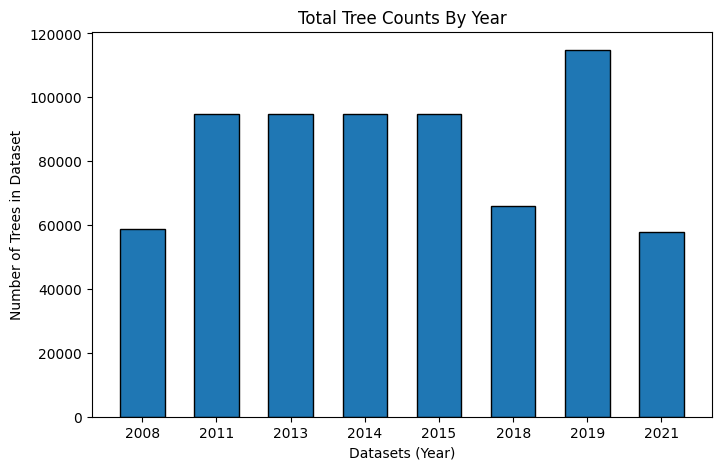

In [40]:
# Create a count of each of the data sets and make a dict to store them
counts = {
    "2008": len(tree_canopy_2008),
    "2011": len(tree_canopy_2011),
    "2013": len(tree_canopy_2013),
    "2014": len(tree_canopy_2014),
    "2015": len(tree_canopy_2015),
    "2018": len(tree_canopy_2018),
    "2019": len(tree_canopy_2019),
    "2021": len(tree_canopy_2021),
}

# From our dict we can make a data frame so it works better with Matplot
df_counts = pd.DataFrame(list(counts.items()), columns=["Year", "Tree Count"])

# Use Matplot lib (as plt) to make our visualiusation
plt.figure(figsize=(8, 5))
plt.bar(df_counts["Year"], df_counts["Tree Count"], width=0.6, edgecolor="black")
plt.xlabel("Datasets (Year)")
plt.ylabel("Number of Trees in Dataset")
plt.title("Total Tree Counts By Year")
plt.show()


From this data we can see that the count fluctuates quite a bit. Some of the data (2011 - 2015) seems to provide a constant count. But others predict a much lower tree count (2008, 2018, 2021) at around 60 thousand. And 2019 shows a much larger count of almost 120 thousand trees. We know from our previous visualisations that they all count from within the same area. So there is some question on which count we should rely on. I believe the more accurate data will be 60 thousand ball park since it was reached multiple times over the years. And might provide a more accurate picture. But this is only an assumption and we have no way to prove that the total count is around 60, 100 or 120 thousand trees within the area of Melbourne city.
### 5.2 Count between the years
With this information we can visualise how different each year has been from its previous. This can help us to see just how different the data collection has been.

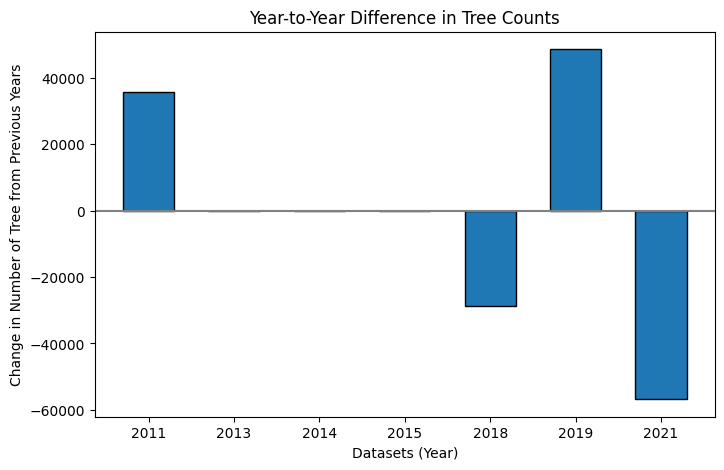

In [41]:

# Find the differecens between each entry and it's previous years
df_counts["Difference"] = df_counts["Tree Count"].diff()

# Plot the difference on our graph using matplotlib
plt.figure(figsize=(8, 5))
plt.bar(df_counts["Year"], df_counts["Difference"], width=0.6, edgecolor="black")
plt.axhline(0, color="gray", linestyle="-")
plt.xlabel("Datasets (Year)")
plt.ylabel("Change in Number of Tree from Previous Years")
plt.title("Year-to-Year Difference in Tree Counts")
plt.show()

Here we can see some pretty large fluctuations between each year. Seemingly some data adds on a large amount in the almost 40 thousand ball park and others drop that same amount. Making it harder to know just how many trees are planted each year.
However, I am curious to investigate the 2013 to 2015 period since it seems to have no real difference from one another. What we can do is make another graph to focus on those years

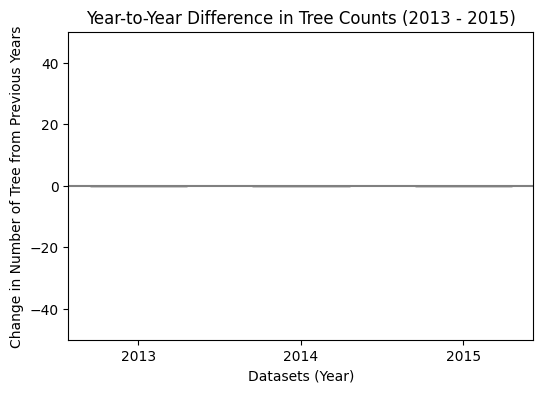

In [42]:
# Make a filter to compare 2013 to 2015
df_zoom = df_counts[df_counts["Year"].isin(["2013", "2014", "2015"])]

# Plot the graph
plt.figure(figsize=(6, 4))
plt.bar(df_zoom["Year"], df_zoom["Difference"], width=0.6, edgecolor="black", color="skyblue")
plt.axhline(0, color="gray", linestyle="-")
plt.xlabel("Datasets (Year)")
plt.ylabel("Change in Number of Tree from Previous Years")
plt.title("Year-to-Year Difference in Tree Counts (2013 - 2015)")

# Automatically zoom in so the differences are easier to see
y_min, y_max = df_zoom["Difference"].min(), df_zoom["Difference"].max()
plt.ylim(y_min - 50, y_max + 50)

plt.show()

Visually it doesn't appear to have any difference so we can print out the actual difference from each of these years.

In [43]:
# Print differences as integers for 2013 to 2015
for _, row in df_counts[df_counts["Year"].isin(["2013", "2014", "2015"])].iterrows():
    print(f"{row['Year']}: {int(row['Difference'])}")


2013: 0
2014: 0
2015: 0


This does seem to answer the question of why the data had been so consistent with the `objectid` from earlier. This is because the data from 2011 had been repeated seemingly till 2015. Perhaps there are other parts of the data I hadn't used in this use case. But seemingly they just removed some columns from the data and otherwise have not made large changes to the source 2011 data.
### 5.3 Visualisualing the data from most recent to oldest.
Here I wanted to compare the 2021 data to our oldest data. While we don't know the accuracy or measuring techniques to cause large changes to the data. Both the 2008 and 2021 data seem to project a similar amount of trees and it would make sense why 2021 might have less trees due to the expansion of the CBD and increase in urbanisation in the last 13 years. Also other projects like new roads or the recent metro tunnel expansion might have also led to the loss of some trees. We can project them both onto the same map similar to what we had done before and have an interesting data projection. Although we should do so with a grain of salt since we cannot know the precise accuracy.

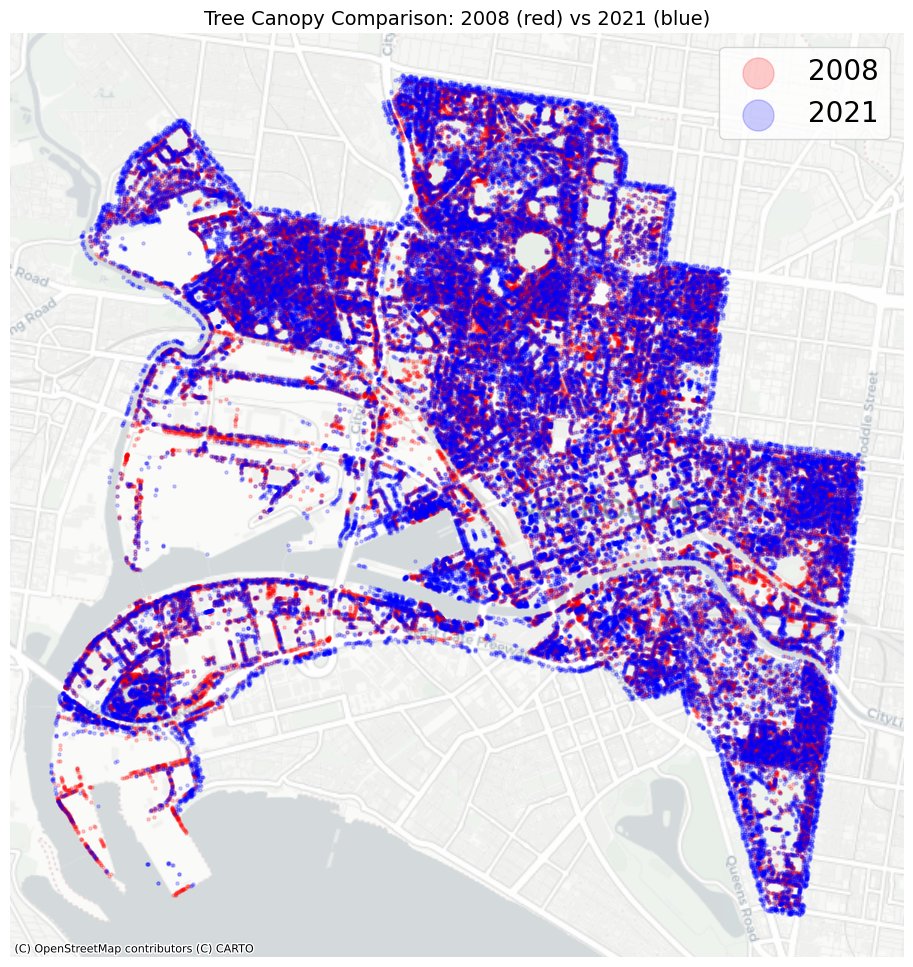

In [44]:
# Create the geo data frames to project the lat and lon points:
gdf_2008 = gpd.GeoDataFrame(
    tree_canopy_2008,
    geometry=gpd.points_from_xy(tree_canopy_2008['lon'], tree_canopy_2008['lat']),
    crs="EPSG:4326"
).to_crs(epsg=3857)

gdf_2021 = gpd.GeoDataFrame(
    tree_canopy_2021,
    geometry=gpd.points_from_xy(tree_canopy_2021['lon'], tree_canopy_2021['lat']),
    crs="EPSG:4326"
).to_crs(epsg=3857)

# Set the size of the plot
fig, ax = plt.subplots(figsize=(12, 12))

# Plot 2008 trees
gdf_2008.plot(ax=ax, alpha=0.2, markersize=5, color="red", label="2008")

# Plot 2021 trees
gdf_2021.plot(ax=ax, alpha=0.2, markersize=5, color="blue", label="2021")

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Add legend and title
plt.axis('off')
plt.legend(loc="upper right",fontsize=20, markerscale=10)
plt.title("Tree Canopy Comparison: 2008 (red) vs 2021 (blue)", fontsize=14)
plt.show()

From this we can see some difference in some sections that do indicate a loss of trees. Especially around the west gate tunnel and ares by the yarra river. And we can see the density in some areas in 2021 is stronger but more condensed compared to the more spread out 2008 data. This concentration might be why we see less trees than the 2008 data.

## Step 6: Conclusion
The urban data project has had many changes in how the data is collected and counted. Because of this it has heavily affected our ability to perform a reliable data analysis and build a clear picture of how Melbourne's urban forest has changed throughout the years.


First the id system was not continuously used and supported meaning that new data cannot be matched to older insights and things like tree ages aren't able to be categorised and calculated. This means the overall project loses some of its value since we can't keep a reliable tracking on our trees.


The second issue and probably the more challenging one is the change in counting. The total number of trees heavily fluctuates (when not repeated over multiple years). And that causes some doubt on all of the data and insights collected from this programme. In the best case scenario it shows a rough estimate of how tree coverage in Melbourne looks and can be used for some projects that don't need an exact count. But others might have real difficulty since it is hard to know exactly how many trees are in Melbourne at any time.


If we make the assumption that our most recent and oldest data are accurate then it tells us that Melbourne is a city whose forest is shrinking. And that makes sense. In the last 13 years the city has grown in size and thus the needs of travel, commerce and homes have increased. These new developments will of course make an effect on the trees within the city. Which is a natural development of all urban areas. However the trees have not diminished in a significant number and have mostly stayed around the 40,000 mark.


Overall, the data does have some flaws that should be considered when moving this project forward and the means for how the counting is done should be evaluated and made standard for the data collection. There should also be some use of the id system since it can provide a more consistent piece of information for all of the trees within the Melbourne city area. 
